# Integrating scRNA-seq Datasets with CONOS (Clustering on Networks of Samples)

**Notebook Authors**: Anthony S. Castanza, PhD & Edwin F. Juárez, PhD
<br>
**Contact Information**: acastanza@ucsd.edu & ejuarez@ucsd.edu

## Summary


This notebook implements the data processing pipeline from the Clustering On Networks Of Samples (CONOS) package **version 1.4.4** to integrate multiple independent single cell RNA-seq experiments into a common projection. This common projection can then be used for investigating gene expression relationships and cell identities across studies in an integrated space.

The underlying code for this notebook based on the CONOS package and is available from: https://github.com/hms-dbmi/conos/
<br>The underlying code for Pagoda2 is available from: https://github.com/hms-dbmi/pagoda2

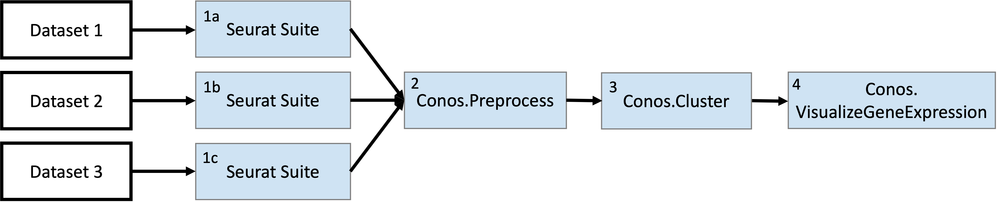

Conos harmonizes different samples by aligning cells using mutual nearest neighbors in PCA space. Unlike some methods, this does not affect the underlying counts matrices and is not considered an integration method rather than batch correction.

#### Conos Summary

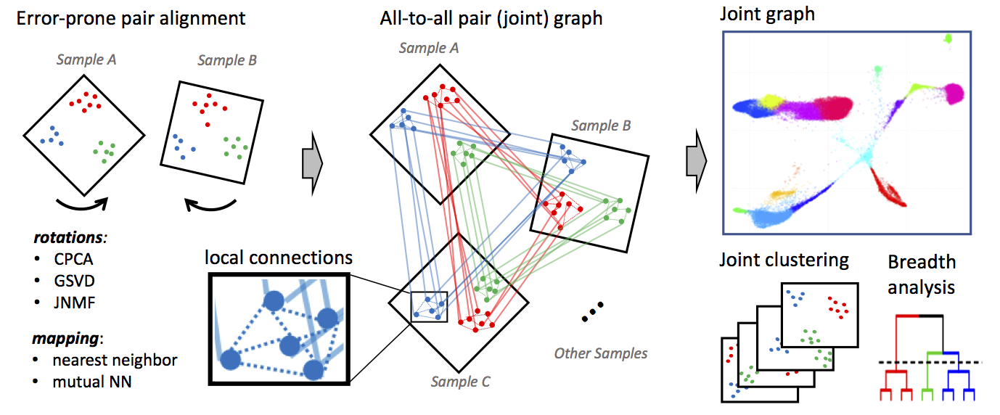
source: https://github.com/kharchenkolab/conos#clustering-on-network-of-samples

## Activate Demo Mode

<div class="alert alert-info">
<p class="lead"> Instructions <i class="fa fa-info-circle"></i></p>
Click run in the cell below to activate demo mode.
</div>

In [5]:
import nbtools
import demo_mode
from IPython.display import display, HTML

@nbtools.build_ui(parameters={'output_var': {'hide': True}})
def activate_demo_mode():
    """Enable demo mode for this notebook"""
    
    # Any job you enable as a demo job will need to be listed here, 
    # along with the module name and any parameters you want matched.
    # Parameters that are not listed will not be matched. You can 
    # list the same module multiple times, assuming you use different 
    # parameter match sets.
    
    demo_mode.set_demo_jobs([
        {
            'name': 'Conos.Preprocess',
            'job': 398284,                                # Make sure to set the permissions of any demo job to 'public'
            'params': {
                'file_list': ['T-Cell_activation_blood.clustered.rds','HNSCC_inmune_blood.clustered.rds','MultipleMyeloma2.clustered.rds'],
                'knn': '40',    # Demo mode should be able to match between int and string, but when in doubt use string
                'perplexity': '50',
                'pagoda_odgenes': '3000',
                'projection_method': 'PCA',
                'ncomps': '50',
                'conos_odgenes': '1000'
            }
        }, 
        {
            'name': 'Conos.Cluster',
            'job': 398314,
            'params': {
                'conos_object': 'conos_preprocess_output.rds',   # For file parameters, just list the file name, not URL
                'runleiden': 'True',
                'leiden_resolution': '1.0',
                'runwalktrap': 'True',
                'walktrap_steps': '10',
                'umap_distance': '0.05',
                'umap_spread': '5'
            },
            
        },
        {
            'name': 'Conos.VisualizeGeneExpression',
            'job': 398471,                                # Make sure to set the permissions of any demo job to 'public'
            'params': {
                'conos_object': 'conos_cluster_output.rds',
                'genesofinterest': 'CD14, LYZ, CCR7, IL7R, S100A4, MS4A1, CD8A, CD19, CD38',
                'clustering': 'leiden',
                'output_file_name': 'ConosMarkers'
            }
        } 
    ])

    # To activate demo mode, just call activate(). This example wraps 
    # the activation call behind a UI Builder cell, but you could have 
    # it called in different ways.

    demo_mode.activate()
    display(HTML('<div class="alert alert-success">Demo mode activated</div>'))
    
    # The code in this call has been left expanded for tutorial purposes

UIBuilder(description='Enable demo mode for this notebook', function_import='nbtools.tool(id="activate_demo_mo…

## Login to GenePattern

In [13]:
# Requires GenePattern Notebook: pip install genepattern-notebook
import gp
import genepattern

# Username and password removed for security reasons.
genepattern.display(genepattern.session.register("https://cloud.genepattern.org/gp", "", ""))

GPAuthWidget()

## Preprocess Datasets

Conos offers two starting points, either a series of Seurat objects, or a matrix of genes by cells. If Seurat is used to analyze the multiple samples independently, the pre-clustered Seurat objects are imported by Conos.Preprocess and assembled into a combined dataset for integration. If text matrixes are provided, Conos.Preprocess performs independent clustering of each of the single-cell quantification tables using the [Pagoda2](https://github.com/kharchenkolab/pagoda2) package and then assembles them into a combined dataset. These clustered results are then projected into C/PCA space and embedded into a joint graph.

<div class="well well-sm">
<b>Note:</b> Conos takes in text files (TXT), with tab-separated gene expression matrices (rows are genes, columns are unique cells), or Seurat objects, however Conos while conos can plot marker genes on embedded graphs from seurat objects, it is not able to perform full differential expression analysis. Additionally, mixing of TXT datasets and Seurat objects in combined runs is not supported.
</div>

<div class="alert alert-info">
<p class="lead"> Instructions <i class="fa fa-info-circle"></i></p>

The three datasets being used here are: 
    
- [T-Cell Activation Blood](https://beta.genepattern.org/gp/users/acastanza/tmp/run5285603678156726512.tmp/file_list/2/T-Cell_activation_blood.clustered.rds)
    
- [Immune cells from Head and Neck Squamous Cell Cercinoma Patient Blood](https://beta.genepattern.org/gp/users/acastanza/tmp/run8675795879138956169.tmp/file_list/3/HNSCC_inmune_blood.clustered.rds)
    
- [Blood cells from Multiple Myeloma](https://beta.genepattern.org/gp/users/acastanza/tmp/run1994500814554805439.tmp/file_list/1/MultipleMyeloma2.clustered.rds) 
 
These files have been completely processed and filtered using the Seurat Suite Pipeline, drag and drop them into the Conos.Preprocess `file list` parameter.
</div>

In [16]:
conos_preprocess_task = gp.GPTask(genepattern.session.get(0), 'urn:lsid:broad.mit.edu:cancer.software.genepattern.module.analysis:00409')
conos_preprocess_job_spec = conos_preprocess_task.make_job_spec()
conos_preprocess_job_spec.set_parameter("file_list", "")
conos_preprocess_job_spec.set_parameter("knn", "40")
conos_preprocess_job_spec.set_parameter("perplexity", "50")
conos_preprocess_job_spec.set_parameter("pagoda_odgenes", "3000")
conos_preprocess_job_spec.set_parameter("projection_method", "PCA")
conos_preprocess_job_spec.set_parameter("ncomps", "50")
conos_preprocess_job_spec.set_parameter("conos_odgenes", "1000")
conos_preprocess_job_spec.set_parameter("job.memory", "64Gb")
conos_preprocess_job_spec.set_parameter("job.queue", "gp-new-beta")
conos_preprocess_job_spec.set_parameter("job.cpuCount", "4")
conos_preprocess_job_spec.set_parameter("job.walltime", "02:00:00")
genepattern.display(conos_preprocess_task)

GPTaskWidget(lsid='urn:lsid:broad.mit.edu:cancer.software.genepattern.module.analysis:00409')

In [19]:
from IPython.display import Image

import genepattern
@genepattern.build_ui(name="Display PNG", parameters={
    "image": {
        "name": "PNG to display:",
        "description": "Render PNG plots from the Conos.VisualizeGeneExpression module",
        "type": "file",
        "kinds": ["png"]
    },
    "output_var": {
    "hide": True
    }
})
def displayPng(image):
    job_widget = nbtools.UIOutput(status="Getting file from the GenePattern server...")
    display(job_widget)
    f = gp.GPFile(genepattern.session.get(0), image)
    basename=os.path.basename(image)
    job_widget.status = 'Writing png file to your workspace. This may take a minute.'
    open(basename, 'wb').write(f.open().read())
    job_widget.status = basename+' successfully written to the same folder as this notebook!'
    return Image(basename)

UIBuilder(function_import='nbtools.tool(id="Display PNG", origin="Notebook").function_or_method', name='Displa…

## Generate and Capture Joint Graph Clusters

This step takes the RDS object produced by Conos.Preprocess, which contains the combined cell matrices as well as metadata about how the matrices were combined, and performs joint clustering. Clustering is performed on the joint graph produced as the output of Conos.Preprocess using two methods, Leiden community clustering and Walktrap clustering. The clustered joint graph is then projected into UMAP space for visualization.

<div class="alert alert-info">
<p class="lead"> Instructions <i class="fa fa-info-circle"></i></p>
Select the <tt>conos_preprocess_output.rds</tt> file produced as the output of the Conos.Preprocess module as the input conos object.
</div>

In [14]:
conos_cluster_task = gp.GPTask(genepattern.session.get(0), 'urn:lsid:broad.mit.edu:cancer.software.genepattern.module.analysis:00410')
conos_cluster_job_spec = conos_cluster_task.make_job_spec()
conos_cluster_job_spec.set_parameter("conos_object", "")
conos_cluster_job_spec.set_parameter("runleiden", "True")
conos_cluster_job_spec.set_parameter("leiden_resolution", "1.0")
conos_cluster_job_spec.set_parameter("runwalktrap", "True")
conos_cluster_job_spec.set_parameter("walktrap_steps", "10")
conos_cluster_job_spec.set_parameter("umap_distance", "0.05")
conos_cluster_job_spec.set_parameter("umap_spread", "5")
conos_cluster_job_spec.set_parameter("job.memory", "64Gb")
conos_preprocess_job_spec.set_parameter("job.queue", "gp-new-beta")
conos_cluster_job_spec.set_parameter("job.walltime", "24:00:00")
conos_cluster_job_spec.set_parameter("job.cpuCount", "3")
genepattern.display(conos_cluster_task)

GPTaskWidget(lsid='urn:lsid:broad.mit.edu:cancer.software.genepattern.module.analysis:00410')

<div class="well well-sm">
    
- Look at Per-sample_Global_Leiden1_Clusters_Individual_UMAP.png to observe the three cohorts separately but with harmonized clusters.
- Look at Per-sample_Global_Leiden1_Clusters_Common_UMAP.png for the same clusters, but with each sample projected into the common UMAP embedding generated from the joint graph.
- Look at Leiden1_Cluster_Composition.png to evaluate how well those cohorts mixed.
</div>

In [10]:
from IPython.display import Image

import genepattern
@genepattern.build_ui(name="Display PNG", parameters={
    "image": {
        "name": "PNG to display:",
        "description": "Render PNG plots from the Conos.VisualizeGeneExpression module",
        "type": "file",
        "kinds": ["png"]
    },
    "output_var": {
    "hide": True
    }
})
def displayPng(image):
    job_widget = nbtools.UIOutput(status="Getting file from the GenePattern server...")
    display(job_widget)
    f = gp.GPFile(genepattern.session.get(0), image)
    basename=os.path.basename(image)
    job_widget.status = 'Writing png file to your workspace. This may take a minute.'
    open(basename, 'wb').write(f.open().read())
    job_widget.status = basename+' successfully written to the same folder as this notebook!'
    return Image(basename)

UIBuilder(function_import='nbtools.tool(id="Display PNG", origin="Notebook").function_or_method', name='Displa…

## Plot Genes of Interest on Embedded Joint Graph

Import the <tt>conos_cluster_output.rds</tt> from the Conos.Cluster module to enable exploration of gene expression on the joint graph. The first cell enables the R UI and passes GenePattern login credentials into the Notebook R session so that the Conos.cluster output can be retreived from the server directly.

Expression of genes of interest can be projected onto the joint graph for visualization of cluster markers.

<div class="alert alert-info">
<p class="lead"> Instructions <i class="fa fa-info-circle"></i></p>
Select the <tt>conos_cluster_output.rds</tt> file produced as the output of the Conos.Cluster module as the input conos object.

For `genesofinterest` input:
    
<tt>CD14, LYZ, CCR7, IL7R, S100A4, MS4A1, CD8A, CD19, CD38<tt>
    
and select "<tt>leiden<tt>" as the method that was used for `clustering`.
</div>

In [15]:
conos_visualizegeneexpression_task = gp.GPTask(genepattern.session.get(0), 'urn:lsid:genepattern.org:genepatternmodules:00423')
conos_visualizegeneexpression_job_spec = conos_visualizegeneexpression_task.make_job_spec()
conos_visualizegeneexpression_job_spec.set_parameter("conos_object", "")
conos_visualizegeneexpression_job_spec.set_parameter("genesofinterest", "")
conos_visualizegeneexpression_job_spec.set_parameter("clustering", "leiden")
conos_visualizegeneexpression_job_spec.set_parameter("output_file_name", "ConosMarkers")
conos_visualizegeneexpression_job_spec.set_parameter("job.memory", "2 Gb")
conos_visualizegeneexpression_job_spec.set_parameter("job.queue", "gp-new-beta")
conos_visualizegeneexpression_job_spec.set_parameter("job.cpuCount", "1")
conos_visualizegeneexpression_job_spec.set_parameter("job.walltime", "02:00:00")
genepattern.display(conos_visualizegeneexpression_task)

GPTaskWidget(lsid='urn:lsid:genepattern.org:genepatternmodules:00423')

### Visualize Genes of Interest Plots

<div class="alert alert-info">
<p class="lead"> Instructions <i class="fa fa-info-circle"></i></p>
Select one of the <tt>ConosMarkers_[x].png</tt> files produced as the output of the Conos.VisualizeGeneExpression module as the input `PNG to Display` object.
</div>

In [11]:
from IPython.display import Image

import genepattern
@genepattern.build_ui(name="Display PNG", parameters={
    "image": {
        "name": "PNG to display:",
        "description": "Render PNG plots from the Conos.VisualizeGeneExpression module",
        "type": "file",
        "kinds": ["png"]
    },
    "output_var": {
    "hide": True
    }
})
def displayPng(image):
    job_widget = nbtools.UIOutput(status="Getting file from the GenePattern server...")
    display(job_widget)
    f = gp.GPFile(genepattern.session.get(0), image)
    basename=os.path.basename(image)
    job_widget.status = 'Writing png file to your workspace. This may take a minute.'
    open(basename, 'wb').write(f.open().read())
    job_widget.status = basename+' successfully written to the same folder as this notebook!'
    return Image(basename)

UIBuilder(function_import='nbtools.tool(id="Display PNG", origin="Notebook").function_or_method', name='Displa…

### CD8A expression, Leiden clustering and sample-independent embeddings


[CD8A is the eponymous marker for CD8 T-Cells](https://www.proteinatlas.org/ENSG00000153563-CD8A)

Compare this to the original Seurat clustering for these data which did not split apart T-Cell subtypes. Integrating multiple datasets improved cell type detection capability and indicated that additional refinement of the dataset in Seurat is warranted.

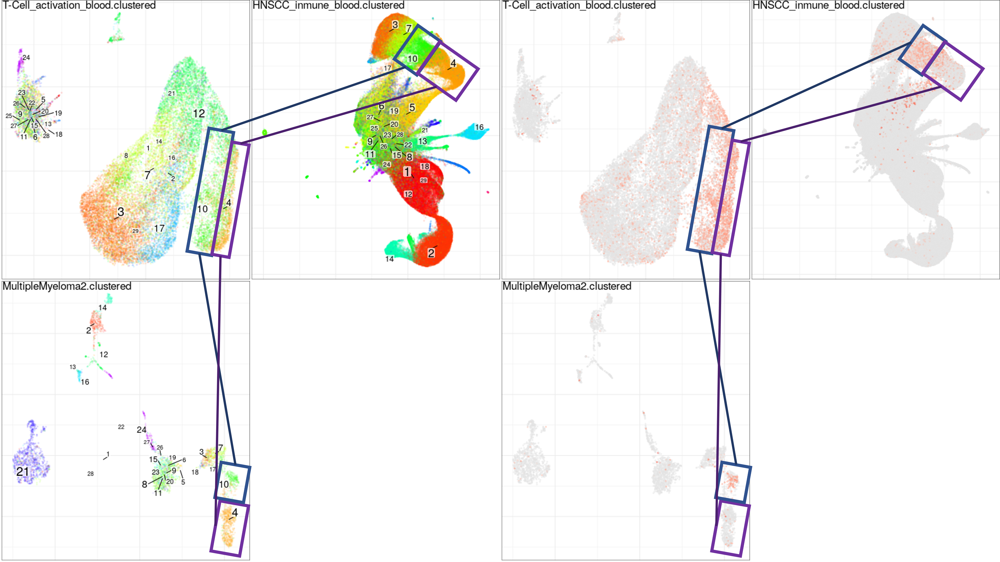

### MS4A1 expression, Leiden clustering and sample-independent embeddings


[MS4A1 expression is a marker of B-cells](https://www.proteinatlas.org/ENSG00000156738-MS4A1/tissue)

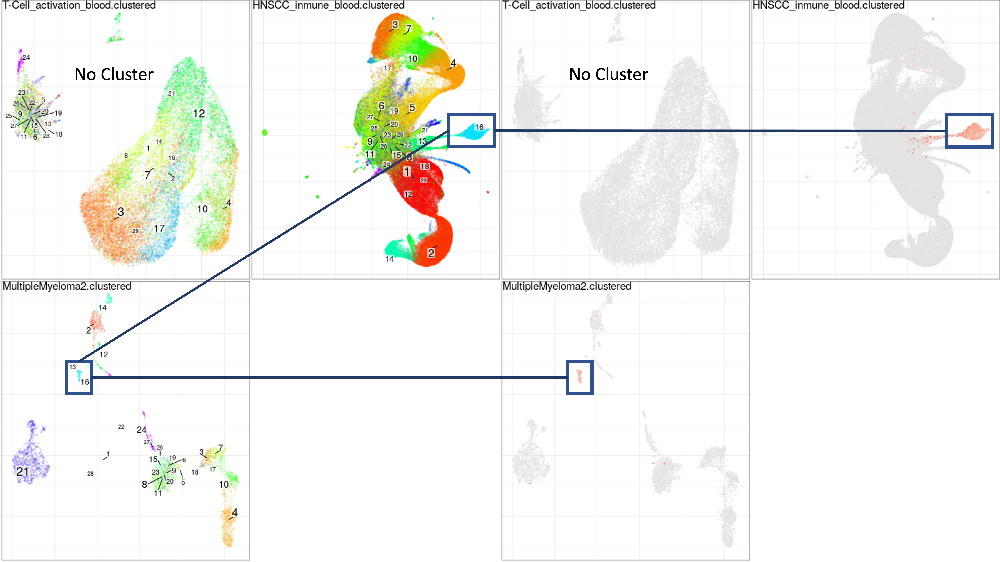

### "A scientist looking at Conos graphs"

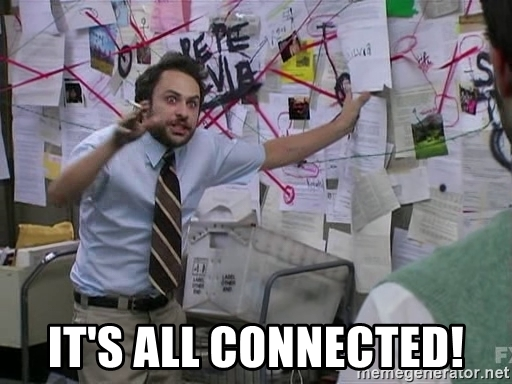

## References
 
- Barkas N., Petukhov V., Nikolaeva D., Lozinsky Y., Demharter S., Khodosevich K., Kharchenko P.V. 2018. Wiring together large single-cell RNA-seq sample collections. bioRxiv 460246; doi: https://doi.org/10.1101/460246 (<a href='https://www.biorxiv.org/content/10.1101/460246v1'>Link</a>).


- Fan J., Salathia N., Liu R., Kaeser G.E., Yung Y.C., Herman J.L., Kaper F., Fan J.B., Zhang K., Chun J., Kharchenko P.V. 2016. Characterizing transcriptional heterogeneity through pathway and gene set overdispersion analysis. Nat Methods. 2016;13(3):241-4. (<a href='https://www.nature.com/articles/nmeth.3734'>Link</a>).
